### Multiple Linear Regression using Gradient Descent  on Seoul Bike Share Demand Data Set
Karthik Ram | The University of Texas | Karthik.Ram@Utdallas.edu | NETID:KCR210004

In [693]:
#Importing necessary libraries and modules
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

plt.rc('font', size=12)
plt.style.use("ggplot")

import warnings
warnings.filterwarnings('ignore')

### Importing and Exploring Data

In [694]:
# Importing the data set
bike_data = pd.read_csv("SeoulBikeData.csv",encoding= 'unicode_escape')
bike_data.head()

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
0,01/12/2017,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
1,01/12/2017,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
2,01/12/2017,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes
3,01/12/2017,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
4,01/12/2017,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes


<AxesSubplot:xlabel='Rented Bike Count', ylabel='Density'>

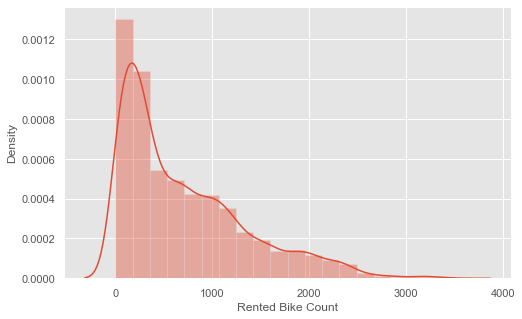

In [695]:
# Plot the histogram of the target variable to check for skewness
fig = plt.figure(figsize=(8,5))
sns.distplot((bike_data['Rented Bike Count']), bins = 20)

In [696]:
bike_data.describe()

,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm)
count,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000
mean,704.602055,11.500000,12.882922,58.226256,1.724909,1436.825799,4.073813,0.569111,0.148687,0.075068
std,644.997468,6.922582,11.944825,20.362413,1.036300,608.298712,13.060369,0.868746,1.128193,0.436746
min,0.000000,0.000000,-17.800000,0.000000,0.000000,27.000000,-30.600000,0.000000,0.000000,0.000000
25%,191.000000,5.750000,3.500000,42.000000,0.900000,940.000000,-4.700000,0.000000,0.000000,0.000000
50%,504.500000,11.500000,13.700000,57.000000,1.500000,1698.000000,5.100000,0.010000,0.000000,0.000000
75%,1065.250000,17.250000,22.500000,74.000000,2.300000,2000.000000,14.800000,0.930000,0.000000,0.000000
max,3556.000000,23.000000,39.400000,98.000000,7.400000,2000.000000,27.200000,3.520000,35.000000,8.800000


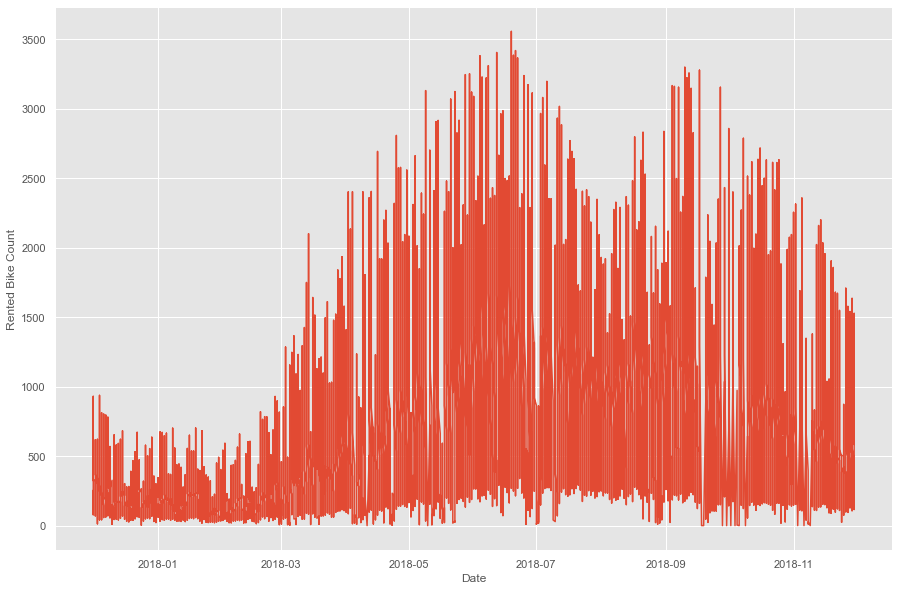

In [697]:
# Checking for time series trends in rented bike count
df = bike_data.copy()
df['Date'] = pd.to_datetime(df['Date'], format='%d/%m/%Y')
df['Weekeday'] = df['Date'].dt.day_name()
df = df.set_index('Date')

fig, ax = plt.subplots(figsize=(15,10))
ax.plot(df.index, df['Rented Bike Count'])
ax.set_xlabel("Date")
ax.set_ylabel("Rented Bike Count")
plt.show()

<Figure size 5000x5000 with 0 Axes>

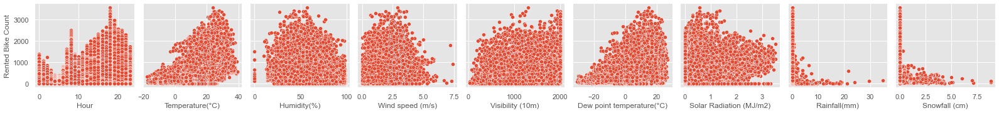

In [698]:
# Checking for patterns in rented bike count vs all other numerical variables
plt.figure(figsize = (10,10),dpi=500)
sns.pairplot(data=bike_data,x_vars=["Hour","Temperature(°C)","Humidity(%)","Wind speed (m/s)","Visibility (10m)","Dew point temperature(°C)","Solar Radiation (MJ/m2)","Rainfall(mm)","Snowfall (cm)"],y_vars="Rented Bike Count")

<Figure size 10000x10000 with 0 Axes>

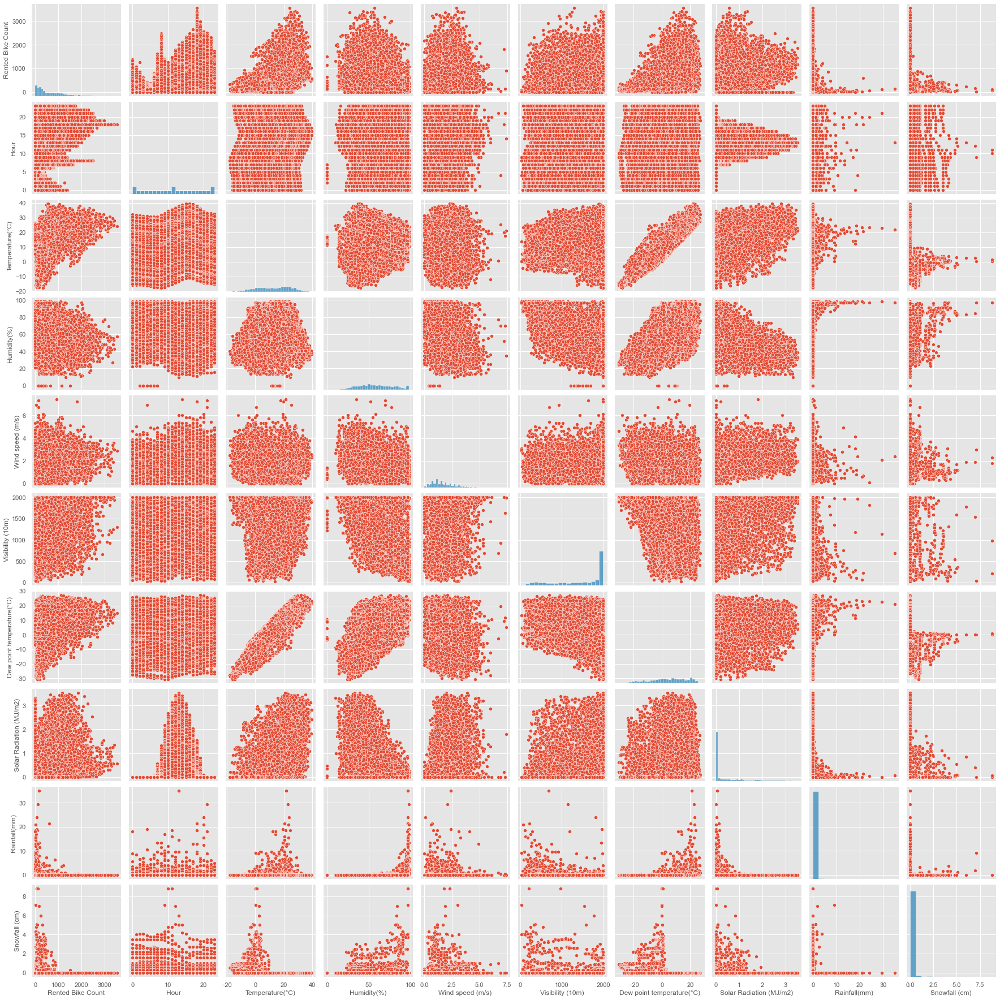

In [699]:
# Checking for patterns in the dataset
plt.figure(figsize = (20,20),dpi=500)
sns.pairplot(data=bike_data)

### Preparing data - mapping, normalizing and splitting

In [700]:
# Creating weekday column
bike_data['Date'] = pd.to_datetime(bike_data['Date'], format='%d/%m/%Y')
bike_data['Weekeday'] = bike_data['Date'].dt.day_name()

# Converting categorical variables to numerical variables
bike_data['Functioning Day'] = bike_data['Functioning Day'].map({'Yes': 1, 'No': 0})
bike_data['Holiday'] = bike_data['Holiday'].map({'No Holiday': 1, 'Holiday': 0})
seasons = pd.get_dummies(bike_data['Seasons'],drop_first=True)
bike_data = pd.concat([bike_data,seasons],axis=1)
weekdays = pd.get_dummies(bike_data['Weekeday'],drop_first=True)
bike_data = pd.concat([bike_data,weekdays],axis=1)

# Droping un-necessary variables
bike_data.drop(['Seasons','Date','Weekeday'], axis=1, inplace=True)
bike_data.head()

,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),...,Functioning Day,Spring,Summer,Winter,Monday,Saturday,Sunday,Thursday,Tuesday,Wednesday
0,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,...,1,0,0,1,0,0,0,0,0,0
1,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,...,1,0,0,1,0,0,0,0,0,0
2,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,...,1,0,0,1,0,0,0,0,0,0
3,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,...,1,0,0,1,0,0,0,0,0,0
4,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,...,1,0,0,1,0,0,0,0,0,0


<AxesSubplot:xlabel='log(Rented Bike Count)', ylabel='Density'>

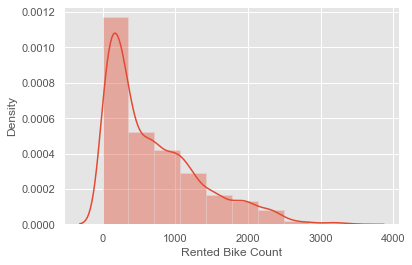

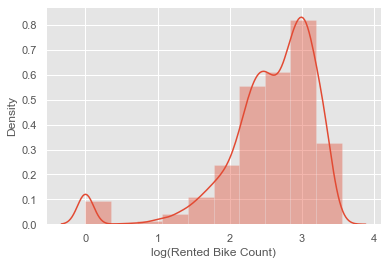

In [701]:
# Plot the histogram of the target variable to check for skewness
fig = plt.figure()
sns.distplot((bike_data['Rented Bike Count']), bins = 10)

# log tranformation (adding 1 to bike count to avoid log(0) error)
bike_data['log(Rented Bike Count)'] = np.log10(bike_data['Rented Bike Count']+1)
fig = plt.figure()
sns.distplot(bike_data['log(Rented Bike Count)'], bins = 10)

In [688]:
# Splitting the data to test and train set
bike_train_data, bike_test_data = train_test_split(bike_data,train_size=0.7,random_state=123)

# Creating Standard Scaler object
scaler = StandardScaler()

#Fitting and transform the train set
scaled_features_train = scaler.fit_transform(bike_train_data)
bike_train_data_scaled = pd.DataFrame(scaled_features_train, 
                                      index=bike_train_data.index, 
                                      columns=bike_train_data.columns)

#Transforming the train set
scaled_features_test = scaler.transform(bike_test_data)
bike_test_data_scaled = pd.DataFrame(scaled_features_test, 
                                     index=bike_test_data.index, 
                                     columns=bike_test_data.columns)


# Adding a column constant for the intercept term
bike_train_data_scaled["const"] = 1
bike_test_data_scaled["const"] = 1

# full feature list
features = ['const','log(Rented Bike Count)', 'Hour', 'Temperature(°C)', 'Humidity(%)',
                    'Wind speed (m/s)', 'Visibility (10m)', 'Dew point temperature(°C)',
                    'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)', 'Holiday',
                    'Functioning Day', 'Spring', 'Summer', 'Winter', 'Monday',
                    'Saturday', 'Sunday', 'Thursday', 'Tuesday', 'Wednesday']

# reordering columns
bike_train_data_scaled = bike_train_data_scaled.reindex(features, axis=1)
bike_test_data_scaled = bike_test_data_scaled.reindex(features, axis=1)

#Checking shape
print(bike_train_data_scaled.shape)
print(bike_test_data_scaled.shape)

#storing dataframes in a list
dfs = [bike_train_data_scaled,bike_test_data_scaled]

(6132, 22)
(2628, 22)


In [690]:
plt.figure(figsize = (20,10),dpi=1550)
sns.heatmap(bike_train_data_scaled.corr(),annot=True)

<AxesSubplot:>

### Multiple Linear Regression

Include a class to work with multiple experiments and plots

In [651]:
class multi_linear_regression():
    def __init__(self,dfs,features,alpha,iterations=None,threshold=None):
        self.bike_train_data = dfs[0]
        self.bike_test_data = dfs[1]
        self.features = features
        self.alpha = alpha
        self.iterations = iterations
        self.threshold = threshold
        self.split_data()
        self.execute_mlr()
        #self.print_model_details()
        
    def split_data(self):
        self.X_train = np.array(self.bike_train_data[self.features])
        self.y_train = np.array(self.bike_train_data['log(Rented Bike Count)'])
        self.X_test = np.array(self.bike_test_data[self.features])
        self.y_test = np.array(self.bike_test_data['log(Rented Bike Count)'])
        
    def cost_function(self,X,y,beta):
        return np.sum(np.square(np.matmul(X, beta) - y)) / (2 * len(y))
    
    def gradient_descent(self,X,y,alpha,iterations,threshold):
        iters = iterations
        betas = np.zeros(X.shape[1])
        m = len(X)
        gd_data_df = pd.DataFrame( columns = ['Betas','Cost'])
        
        if threshold is None:
            for i in range(iterations):
                gradient = (1/m) * np.matmul(X.T, np.matmul(X, betas) - y)
                betas = betas - alpha * gradient
                cost = self.cost_function(X, y, betas)
                gd_data_df.loc[i] = [betas,cost]
        else:
            updated_threshold = float('Inf')
            prev_cost = 0
            iters = 0
            while threshold < updated_threshold:
                iters = iters + 1
                gradient = (1/m) * np.matmul(X.T, np.matmul(X, betas) - y)
                betas = betas - alpha * gradient
                cost = self.cost_function(X, y, betas)
                gd_data_df.loc[iters-1] = [betas,cost]
                if iters > 1:
                    updated_threshold = (abs(cost - prev_cost) / (prev_cost))*100
                prev_cost = cost
                
        self.alpha = alpha
        self.iters = iters
        self.coeffs = gd_data_df["Betas"][len(gd_data_df)-1]
        self.train_r2 = self.get_r_squared_train()
        self.test_r2 = self.get_r_squared_test()
        return gd_data_df
    
    def plot_cost_iter(self):
        plt.figure(figsize = (15,5))
        plt.xlabel("Iterations")
        plt.ylabel("Cost")
        plt.plot(self.gradient_descent_df.index,self.gradient_descent_df['Cost'])
        
    def plot_residuals(self,X,y,beta,title=None):
        residuals = np.matmul(X, beta) - y
        fig, axs = plt.subplots(1, 2,figsize=(15,5))
        fig.suptitle(title)
        axs[0].scatter(y,residuals,s=0.5)
        axs[0].set(xlabel="Scaled y values", ylabel="Residuals")
        sns.distplot(residuals, ax=axs[1], bins = 20)
        axs[1].set(xlabel="Residuals", ylabel="Density")
        
    def execute_mlr(self):
        self.gradient_descent_df = self.gradient_descent(self.X_train,
                                                         self.y_train,
                                                         self.alpha,
                                                         self.iterations,
                                                         self.threshold)
        
    def print_model_details(self):
        print("-------------------------------------------------------------------------")
        print("Gradient Descent Completed")
        print("Learning Rate        :",self.alpha)
        print("Number of iterations :",self.iters)
        print("Train set R-Squared  :",round(self.train_r2,3))
        print("Test set R-Squared   :",round(self.test_r2,3))
        
    def print_model(self):
        coeffs = [round(coeff,3) for coeff in self.coeffs]
        model = [None]*(len(coeffs)+len(self.features))
        model[::2] = coeffs
        model[1::2] = self.features
        model = ''.join(str(model)) 
        print(model)
        
    def get_r_squared(self, X, y, beta):
        ssr = np.sum(np.square(np.matmul(X, beta) - y))
        sst = np.sum(np.square(y - np.mean(y)))
        r2 = 1 - ssr/sst
        return r2
    
    def get_r_squared_train(self):
        return self.get_r_squared(self.X_train, self.y_train, self.coeffs)
        
    def get_r_squared_test(self):
        return self.get_r_squared(self.X_test, self.y_test, self.coeffs)
    
    def plot_test_residuals(self):
        self.plot_residuals(self.X_test, 
                            self.y_test, 
                            self.coeffs,
                            "Residual plot and distribution of errors - test set")
        
    def plot_train_residuals(self):
        self.plot_residuals(self.X_train, 
                            self.y_train, 
                            self.coeffs,
                            "Residual plot and distribution of errors - train set")

-------------------------------------------------------------------------
Gradient Descent Completed
Learning Rate        : 0.01
Number of iterations : 1000
Train set R-Squared  : 0.779
Test set R-Squared   : 0.811


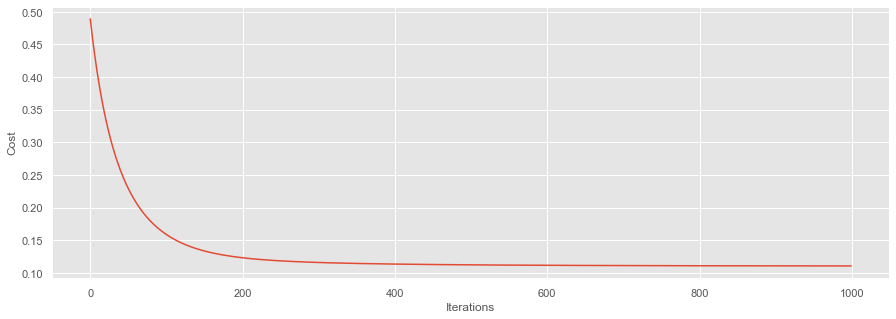

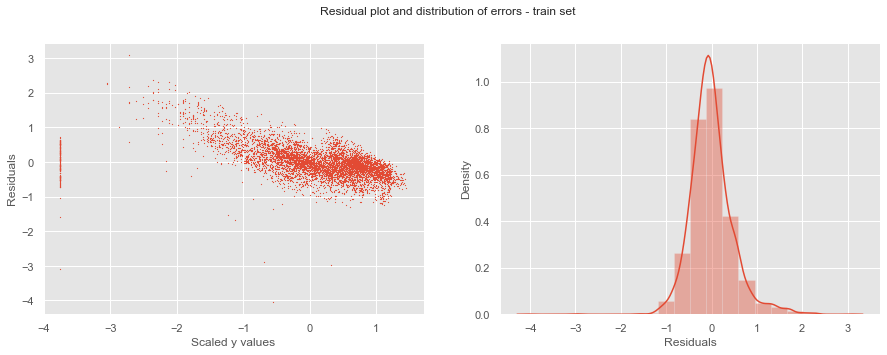

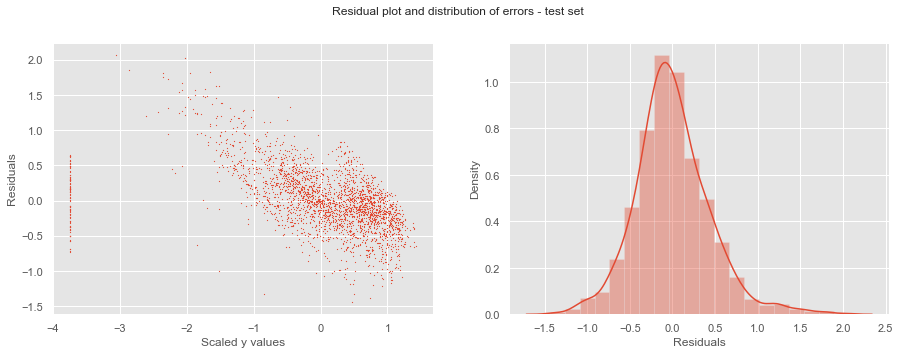

In [653]:

features = ['const','Hour', 'Temperature(°C)', 'Humidity(%)', 
            'Wind speed (m/s)', 'Visibility (10m)', 'Dew point temperature(°C)', 
            'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)', 'Holiday', 
            'Functioning Day', 'Spring', 'Summer', 'Winter']

alpha = 0.01
iterations = 1000

lm1 = multi_linear_regression(dfs=dfs,features=features,alpha=alpha,iterations=iterations)
lm1.print_model_details()
lm1.plot_cost_iter()
lm1.plot_train_residuals()
lm1.plot_test_residuals()

-------------------------------------------------------------------------
Gradient Descent Completed
Learning Rate        : 0.001
Number of iterations : 21064
Train set R-Squared  : 0.779
Test set R-Squared   : 0.812


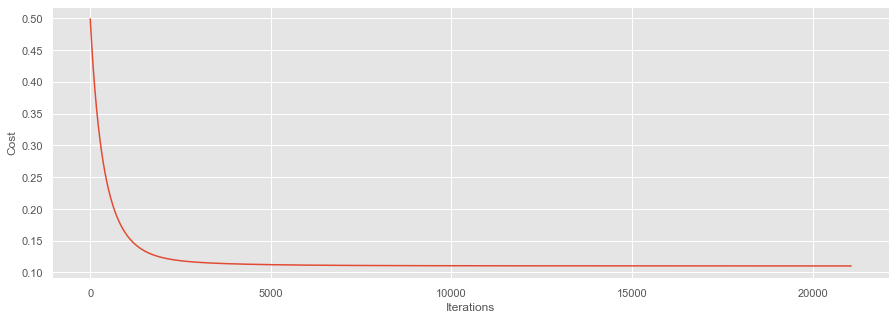

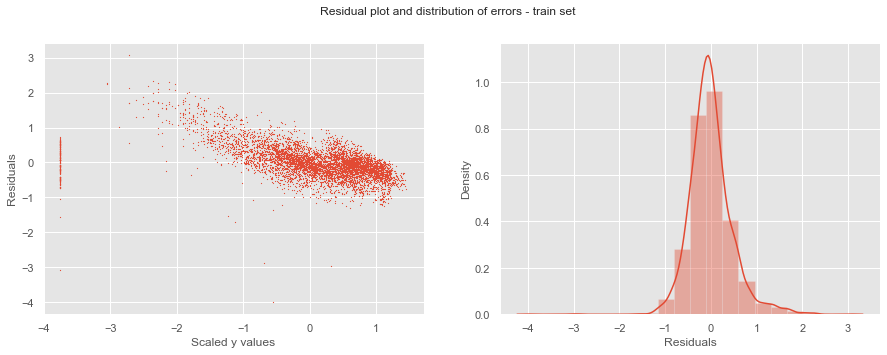

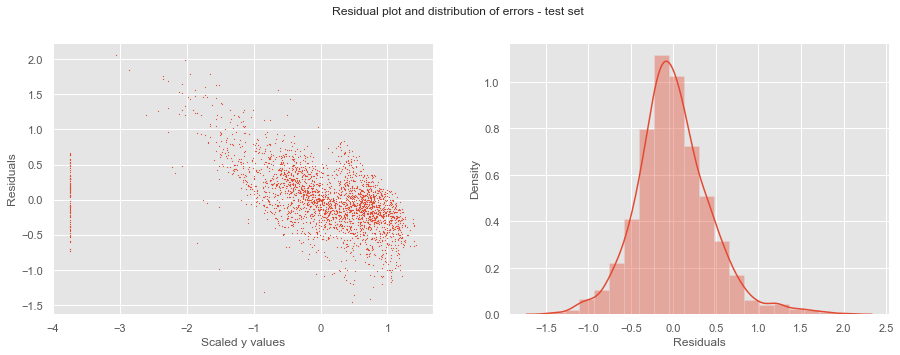

In [654]:
df = bike_data

features = ['const','Hour', 'Temperature(°C)', 'Humidity(%)', 
            'Wind speed (m/s)', 'Visibility (10m)', 'Dew point temperature(°C)', 
            'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)', 'Holiday', 
            'Functioning Day', 'Spring', 'Summer', 'Winter']

alpha = 0.001
threshold=0.00001

lm1 = multi_linear_regression(dfs=dfs,features=features,alpha=alpha,threshold=threshold)
lm1.print_model_details()
lm1.plot_cost_iter()
lm1.plot_train_residuals()
lm1.plot_test_residuals()

## Experiments

1. Experiment with various parameters for linear regression (e.g. learning rate ∝) and report on your findings as how the error varies for train and test sets with varying these parameters. Plot the results. Report the best values of the parameters.

- The following Hyperparameters are checked for R-Squared in test and train set
    - Learning Rate
    - Iterations
    - Threshold


In [655]:
iterations = 100
learning_rates = [0.5,0.4,0.3,0.2,0.1,0.05,0.025,0.01,0.005,0.0025,0.001,0.0005,0.00025,0.0001,0.00005,0.000025,0.00001]
models = []
expt1_df1 = pd.DataFrame( columns = ['Learning Rate','Train R2','Test R2'])

for alpha in learning_rates:
    models.append(multi_linear_regression(dfs=dfs,features=features,alpha=alpha,iterations=iterations))  
    test_r2 = models[-1].test_r2
    train_r2 = models[-1].train_r2
    expt1_df1.loc[len(expt1_df1.index)] = [alpha, train_r2, test_r2] 

#expt1_df1 = expt1_df1.set_index('Learning Rate')
expt1_df1

,Learning Rate,Train R2,Test R2
0,0.500000,0.779901,0.811814
1,0.400000,0.779740,0.811730
2,0.300000,0.779565,0.811641
3,0.200000,0.779365,0.811564
4,0.100000,0.778771,0.811128
5,0.050000,0.775440,0.807540
6,0.025000,0.763234,0.793115
7,0.010000,0.680854,0.700155
8,0.005000,0.536154,0.546005
9,0.002500,0.364053,0.368288


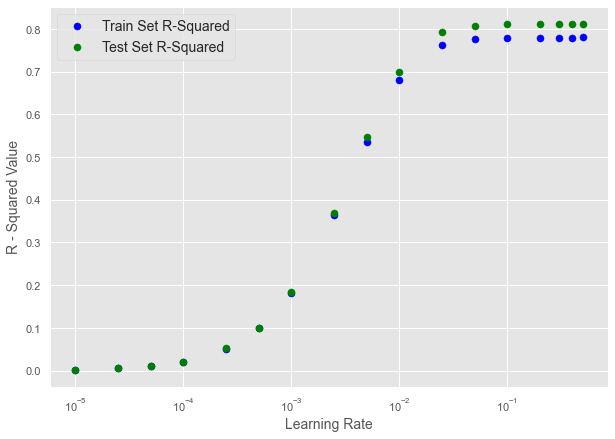

In [656]:
ax = expt1_df1.plot.scatter(x='Learning Rate', y='Train R2',
                            color="Blue", label="Train Set R-Squared",figsize=(10,7),s=50)
ax = expt1_df1.plot.scatter(x='Learning Rate', y='Test R2', 
                            color="Green", label="Test Set R-Squared", ax=ax,s=50);
ax.set_xscale('log')
ax.set_ylabel("R - Squared Value",fontdict={'fontsize':14})
ax.set_xlabel("Learning Rate",fontdict={'fontsize':14})
ax.legend(fontsize=14)

In [657]:
iterations = [5,10,25,50,100,150,200,300,400,500,1000,2000,5000]
learning_rate = 0.001
models = []
expt1_df2 = pd.DataFrame( columns = ['Iterations','Train R2','Test R2'])

for iteration in iterations:
    models.append(multi_linear_regression(dfs=dfs,features=features,alpha=learning_rate,iterations=iteration))  
    test_r2 = models[-1].test_r2
    train_r2 = models[-1].train_r2
    expt1_df2.loc[len(expt1_df2.index)] = [iteration, train_r2, test_r2] 
    
expt1_df2

,Iterations,Train R2,Test R2
0,5.0,0.010718,0.010616
1,10.0,0.021243,0.021201
2,25.0,0.051703,0.051851
3,50.0,0.098994,0.099488
4,100.0,0.182124,0.183411
5,150.0,0.252459,0.254650
6,200.0,0.312388,0.315570
7,300.0,0.408146,0.413482
8,400.0,0.480220,0.487814
9,500.0,0.535551,0.545399


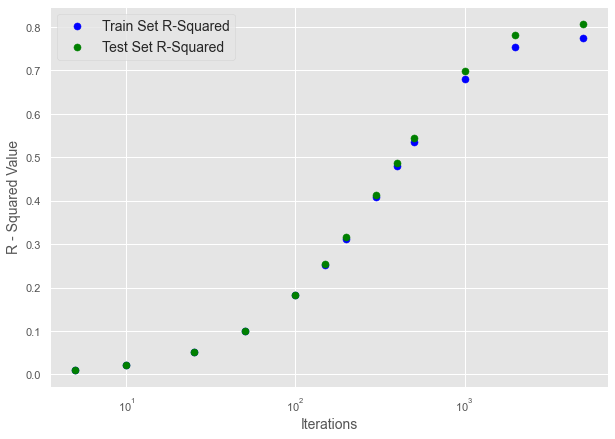

In [658]:
ax = expt1_df2.plot.scatter(x='Iterations', y='Train R2',
                            color="Blue", label="Train Set R-Squared",figsize=(10,7),s=50)
ax = expt1_df2.plot.scatter(x='Iterations', y='Test R2', 
                            color="Green", label="Test Set R-Squared", ax=ax,s=50);
ax.set_xscale('log')
ax.set_ylabel("R - Squared Value",fontdict={'fontsize':14})
ax.set_xlabel("Iterations",fontdict={'fontsize':14})
ax.legend(fontsize=14)

2. Experiment with various thresholds for convergence for linear and regression. Plot error results for train and test sets as a function of threshold and describe how varying the threshold affects error. Pick your best threshold and plot train and test error (in one figure) as a function of number of gradient descent iterations.

- threshold vs cost  [what do you mean by threshold and covergence? ]
- get best threshold
    - error vs number of iterations test
    - error vs number of iteration train

In [659]:
thresholds = [5,4,2.5,2,1.5,1,0.75,0.5,0.25,0.1,0.05,0.025,0.01,
              0.005,0.0025,0.001,0.0005,0.00025,
              0.0001,0.00005,0.000025,0.00001,
              0.000005,0.0000025,0.000001]
learning_rate = 0.01
models = []
expt2_df1 = pd.DataFrame( columns = ['Threshold','Iterations','Train R2','Test R2'])

for threshold in thresholds:
    models.append(multi_linear_regression(dfs=dfs,features=features,alpha=learning_rate,threshold=threshold))  
    test_r2 = models[-1].test_r2
    train_r2 = models[-1].train_r2
    iters = models[-1].iters
    expt2_df1.loc[len(expt2_df1.index)] = [threshold,iters, train_r2, test_r2] 

expt2_df1

,Threshold,Iterations,Train R2,Test R2
0,5.000000,2.0,0.042060,0.042140
1,4.000000,2.0,0.042060,0.042140
2,2.500000,2.0,0.042060,0.042140
3,2.000000,6.0,0.117606,0.118240
4,1.500000,26.0,0.374776,0.379216
5,1.000000,54.0,0.555380,0.566120
6,0.750000,74.0,0.625544,0.640416
7,0.500000,101.0,0.682444,0.701893
8,0.250000,147.0,0.730428,0.755160
9,0.100000,208.0,0.755471,0.783937


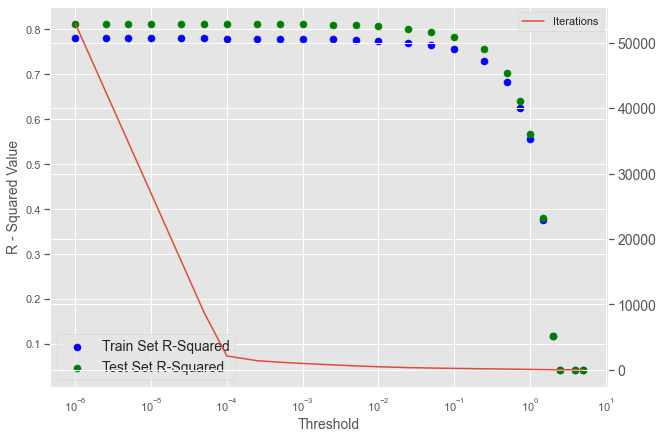

In [660]:
ax = expt2_df1.plot.scatter(x='Threshold', y='Train R2',
                            color="Blue", label="Train Set R-Squared",figsize=(10,7),s=50)
ax = expt2_df1.plot.scatter(x='Threshold', y='Test R2', 
                            color="Green", label="Test Set R-Squared", ax=ax,s=50);
ax.set_xscale('log')
ax.set_ylabel("R - Squared Value",fontdict={'fontsize':14})
ax.set_xlabel("Threshold",fontdict={'fontsize':14})
ax.legend(fontsize=14)

ax2 = ax.twinx()
ax2 = expt2_df1.plot(x='Threshold',y='Iterations',legend=True, ax=ax2, fontsize=14)


3. Pick eight features randomly and retrain your model only on these eight features. Compare train and test error results for the case of using your original set of all features and eight random features. Report the eight randomly selected features.

- 8 random features
    - error plot 8 random vs error plot all features test
    - error plot 8 random vs error plot all features train

-------------------------------------------------------------------------
Gradient Descent Completed
Learning Rate        : 0.01
Number of iterations : 1867
Train set R-Squared  : 0.233
Test set R-Squared   : 0.207


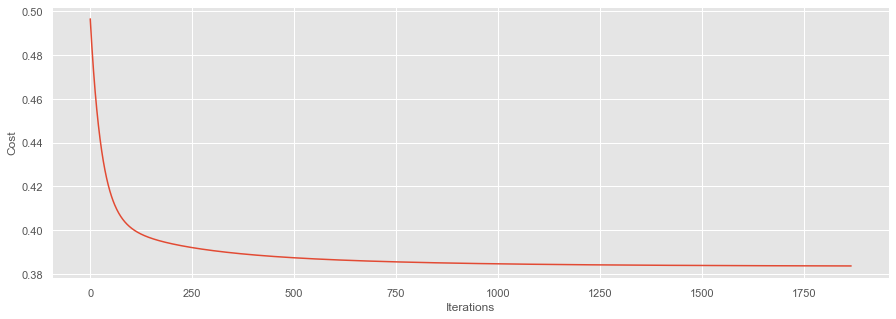

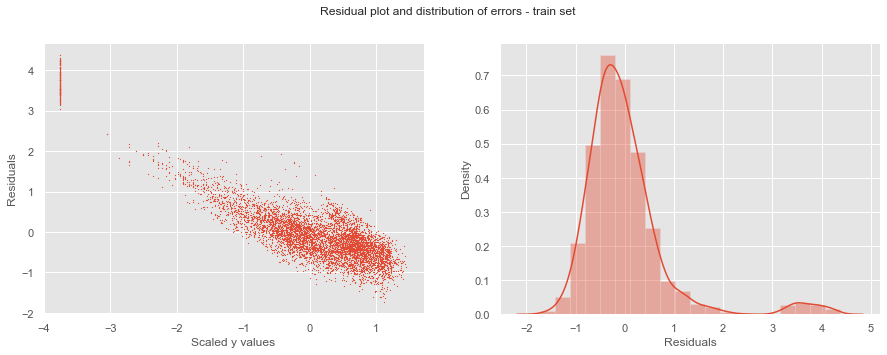

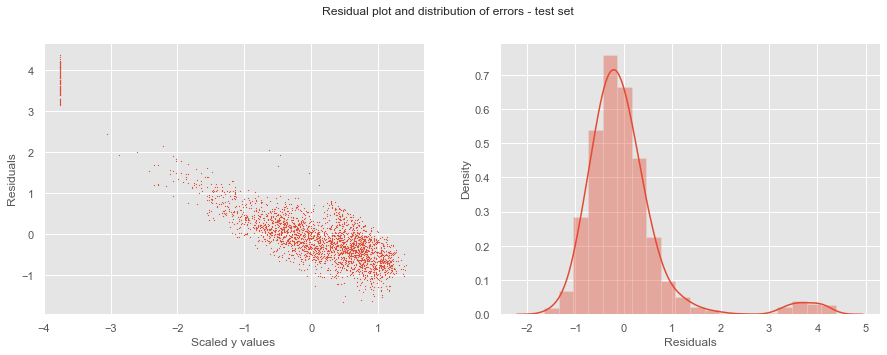

In [663]:
features = ['const','Hour', 'Temperature(°C)', 'Humidity(%)', 
            'Wind speed (m/s)', 'Visibility (10m)', 'Dew point temperature(°C)', 
            'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)', 'Holiday', 
            'Functioning Day', 'Spring', 'Summer', 'Winter']


features_8 = ['const', 'Wind speed (m/s)', 'Humidity(%)', 'Visibility (10m)','Solar Radiation (MJ/m2)',
                       'Spring', 'Winter','Summer', 'Dew point temperature(°C)']

learning_rate = 0.01
threshold = 0.0001

mlr_model_f8 = multi_linear_regression(dfs=dfs,features=features_8,alpha=learning_rate,threshold=threshold)
mlr_model_f8.print_model_details()
mlr_model_f8.plot_cost_iter()
mlr_model_f8.plot_train_residuals()
mlr_model_f8.plot_test_residuals()

4. Now pick eight features that you think are best suited to predict the output, and retrain your model using these eight features. Compare to the case of using your original set of features and to the random features case. Did your choice of features provide better results than picking random features? Why? Did your choice of features provide better results than using all features? Why?
        
- 8 impt features
    - compare results of 8 pickes vs
        - random features
        - all features

Have metrics to measure performance
    

-------------------------------------------------------------------------
Gradient Descent Completed
Learning Rate        : 0.01
Number of iterations : 1089
Train set R-Squared  : 0.265
Test set R-Squared   : 0.243


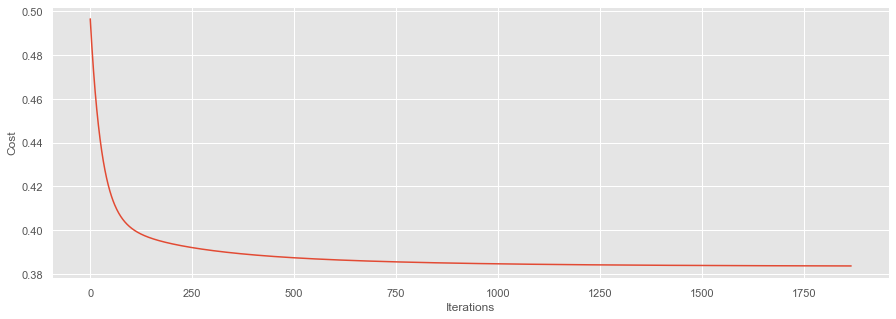

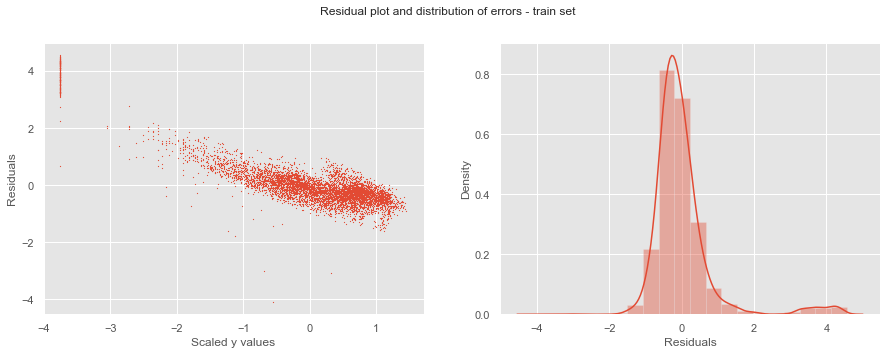

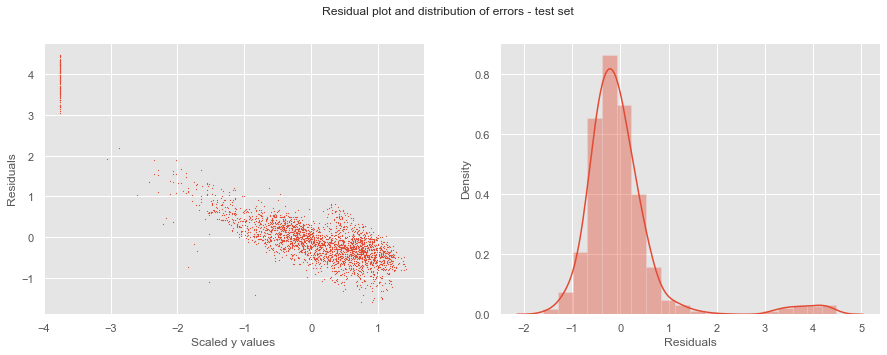

In [703]:
suited_features = [ 'const','Hour', 'Temperature(°C)', 'Humidity(%)', 'Wind speed (m/s)',
                    'Visibility (10m)', 'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)']

learning_rate = 0.01
threshold = 0.0001


mlr_model_suited = multi_linear_regression(dfs=dfs,features=suited_features,alpha=learning_rate,threshold=threshold)
mlr_model_suited.print_model_details()
mlr_model_f8.plot_cost_iter()
mlr_model_suited.plot_train_residuals()
mlr_model_suited.plot_test_residuals()